In [1]:
import numpy as np
from scipy.spatial.distance import hamming

import cv2
import matplotlib.pyplot as plt


In [46]:
def plot(img1, img2, keys1, keys2, match):
    
    fig, ax = plt.subplots(figsize=(25, 35))
    
    new_img = cv2.drawMatches(img1, keys1, img2, keys2, match[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))
    
    plt.show()

In [3]:
def orb(img1, img2):
    orb = cv2.ORB_create()
    keys1, desc1 = orb.detectAndCompute(img1, None)
    keys2, desc2 = orb.detectAndCompute(img2, None)

    print(str(len(keys1)) + ", " + str(desc1.shape))
    print(str(len(keys2)) + ", " + str(desc2.shape)) 
    
    return keys1, keys2, desc1, desc2

In [4]:
def cv_match(img1, img2):

    keys1, keys2, desc1, desc2 = orb(img1, img2)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    match = bf.match(desc1, desc2)
    match = sorted(match, key = lambda x: x.distance)

    plot(img1, img2, keys1, keys2, match)

In [23]:
def custom_match(img1, img2):

    keys1, keys2, desc1, desc2 = orb(img1, img2)

    match = []
    for i, k1 in enumerate(desc1):
        for j, k2 in enumerate(desc2):
            match.append(cv2.DMatch(_distance = hamming(k1, k2) * len(k1), _imgIdx = 0, _queryIdx = i, _trainIdx = j))
    match = sorted(match, key = lambda x: x.distance)

    plot(img1, img2, keys1, keys2, match)

500, (500, 32)
500, (500, 32)


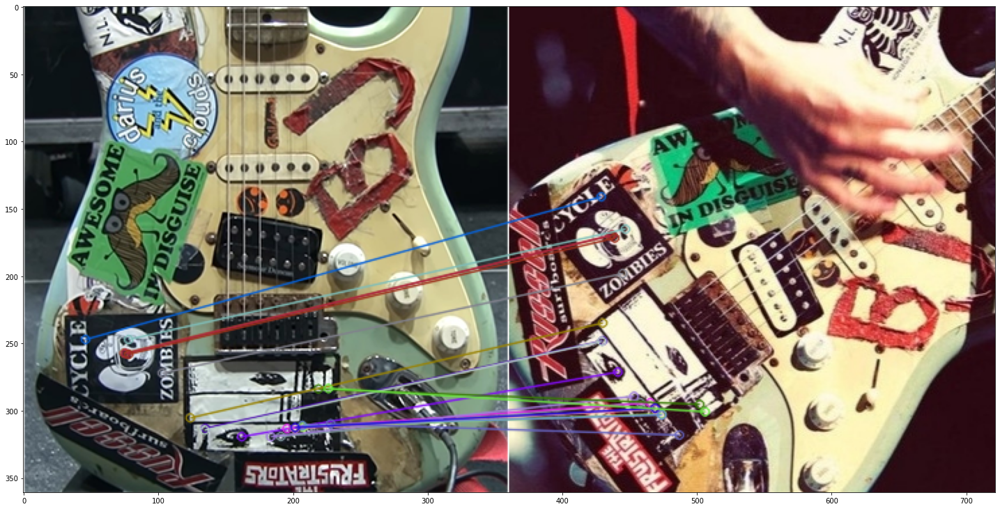

In [47]:
cv_match(cv2.imread('1-1.png'), cv2.imread('1-2.png'))

500, (500, 32)
500, (500, 32)


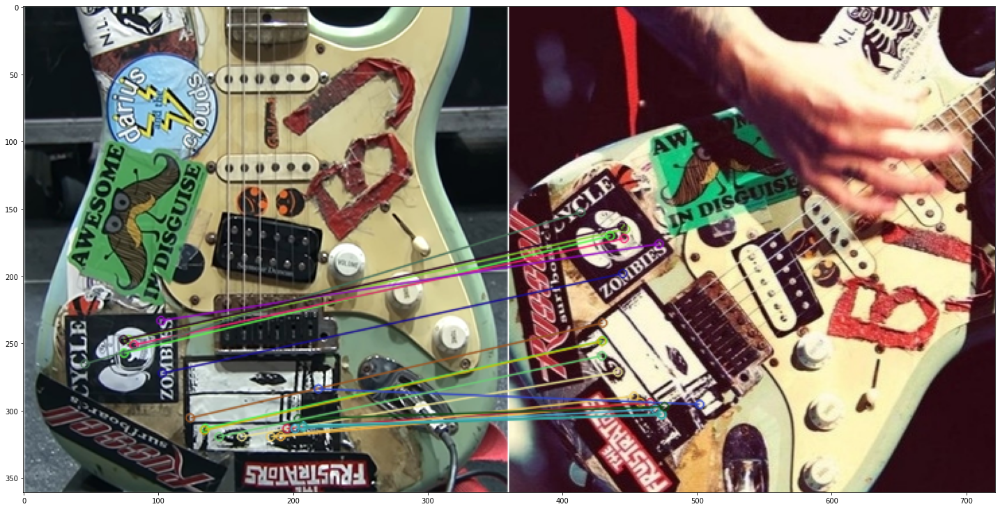

In [29]:
custom_match(cv2.imread('1-1.png'), cv2.imread('1-2.png'))

500, (500, 32)
500, (500, 32)


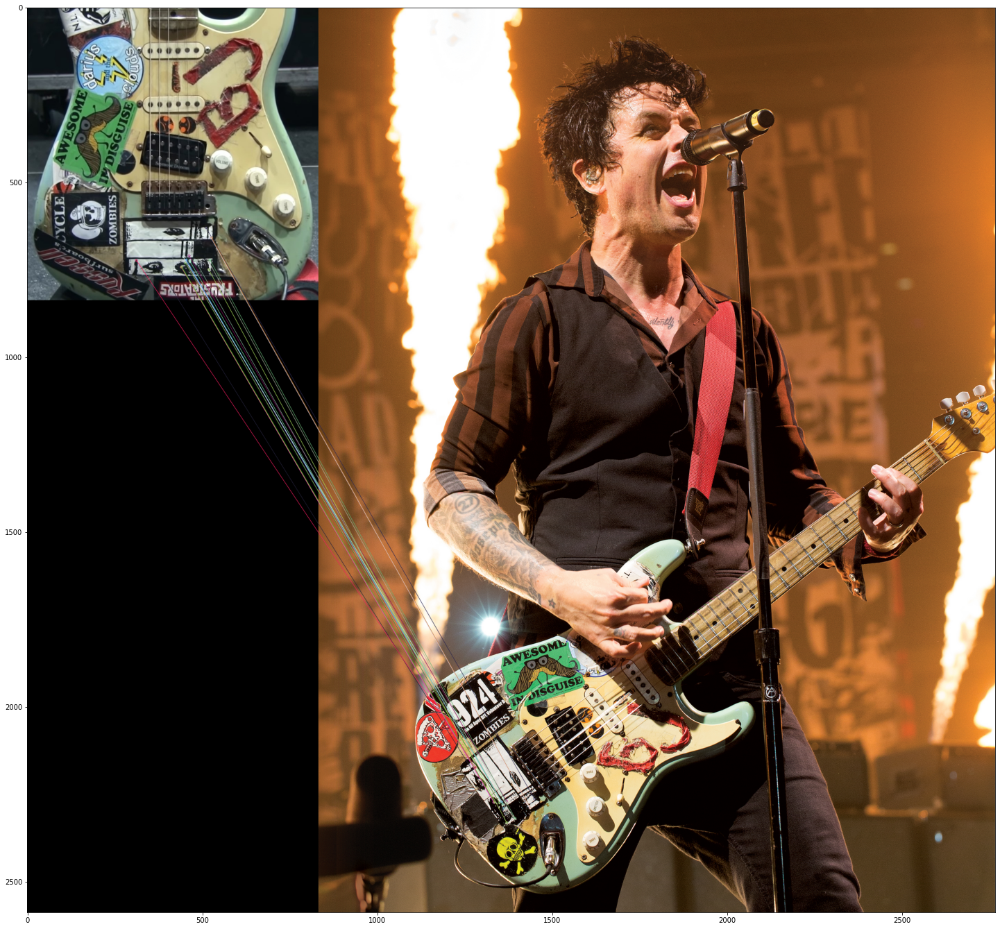

In [48]:
cv_match(cv2.imread('1-3.png'), cv2.imread('1-4.png'))

500, (500, 32)
500, (500, 32)


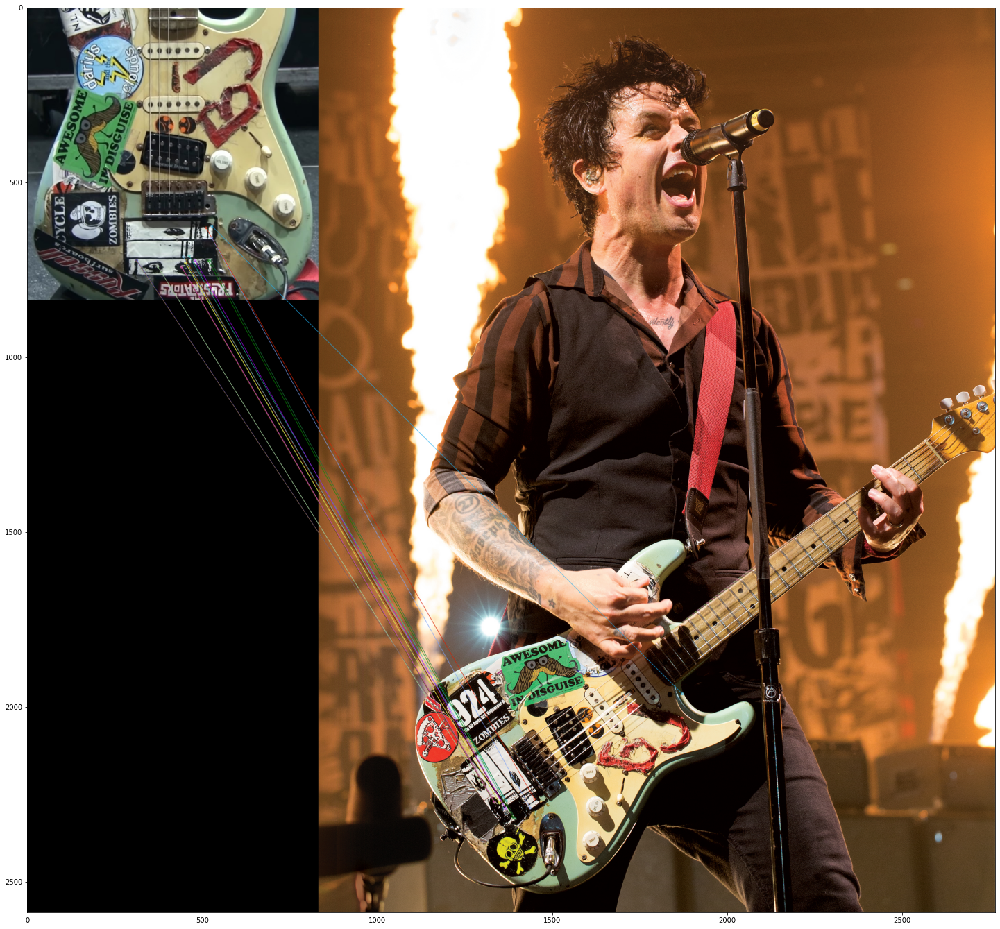

In [49]:
custom_match(cv2.imread('1-3.png'), cv2.imread('1-4.png'))